The challenge is to recognize fraudulent credit card transactions so that the customers of credit card companies are not charged for items that they did not purchase.

#### Main challenges involved in credit card fraud detection are:

1. Enormous Data is processed every day and the model build must be fast enough to respond to the scam in time.

2. Imbalanced Data i.e most of the transactions (99.8%) are not fraudulent which makes it really hard for detecting the fraudulent ones

3. Data availability as the data is mostly private.

4. Misclassified Data can be another major issue, as not every fraudulent transaction is caught and reported.

5. Adaptive techniques used against the model by the scammers.

#### How to tackle these challenges?

1. The model used must be simple and fast enough to detect the anomaly and classify it as a fraudulent transaction as quickly as possible.

2. Imbalance can be dealt with by properly using some methods which we will talk about in the next paragraph For protecting the privacy of the user the dimensionality of the data can be reduced.

3. A more trustworthy source must be taken which double-check the data, at least for training the model.

4. We can make the model simple and interpretable so that when the scammer adapts to it with just some tweaks we can have a new model up and running to deploy.

### Code : Importing all the necessary Libraries

In [1]:
# import the necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Code : Loading the Data

In [2]:
data = pd.read_csv("/kaggle/input/credit-card-fraud-detection/creditcard.csv")

### Code : Understanding the Data

In [3]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [30]:
from dataprep.eda import create_report

  0%|          | 0/7102 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
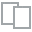
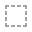
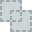
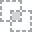
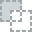
...
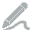
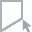
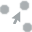
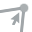
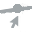

In [32]:
create_report(data)

### Code : Describing the Data

In [4]:
print(data.shape)
print(data.describe())

(284805, 31)
                Time             V1             V2             V3  \
count  284805.000000  284805.000000  284805.000000  284805.000000   
mean    94813.311999       0.000003      -0.000001      -0.000005   
std     47487.863126       1.958702       1.651314       1.516259   
min         0.000000     -56.407510     -72.715728     -48.325589   
25%     54201.000000      -0.920375      -0.598555      -0.890372   
50%     84691.000000       0.018109       0.065486       0.179845   
75%    139320.000000       1.315648       0.803728       1.027201   
max    172788.000000       2.454930      22.057729       9.382558   

                 V4             V5            V6             V7            V8  \
count  2.848050e+05  284805.000000  2.848050e+05  284805.000000  2.848050e+05   
mean  -6.443977e-07       0.000001  9.097131e-08      -0.000003 -9.286881e-07   
std    1.415873e+00       1.380251  1.332275e+00       1.237094  1.194356e+00   
min   -5.683171e+00    -113.743307 -2.616

### Code : Imbalance in the data

In [5]:
fraud = data[data['Class'] == 1]
valid = data[data['Class'] == 0]
outlierFraction = len(fraud)/float(len(valid))
print(outlierFraction)
print('Fraud Cases: {}'.format(len(data[data['Class'] == 1])))
print('Valid Transactions: {}'.format(len(data[data['Class'] == 0])))

0.001730487174346583
Fraud Cases: 492
Valid Transactions: 284313


Only 0.17% fraudulent transaction out all the transactions. The data is highly Unbalanced. Lets first apply our models without balancing it and if we don’t get a good accuracy then we can find a way to balance this dataset. But first, let’s implement the model without it and will balance the data only if needed.

### Code : Print the amount details for Fraudulent Transaction

In [12]:
print('Amount details of the fraudulent transaction: ')
print(fraud.Amount.describe())

Amount details of the fraudulent transaction: 
count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64


### Code : Print the amount details for Normal(valid) Transaction

In [15]:
print('Details of valid transaction')
print(valid.Amount.describe())

Details of valid transaction
count    284313.000000
mean         88.290845
std         250.105812
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64


As we can clearly notice from this, the average Money transaction for the fraudulent ones is more. This makes this problem crucial to deal with.

### Code : Plotting the Correlation Matrix
The correlation matrix graphically gives us an idea of how features correlate with each other and can help us predict what are the features that are most relevant for the prediction.

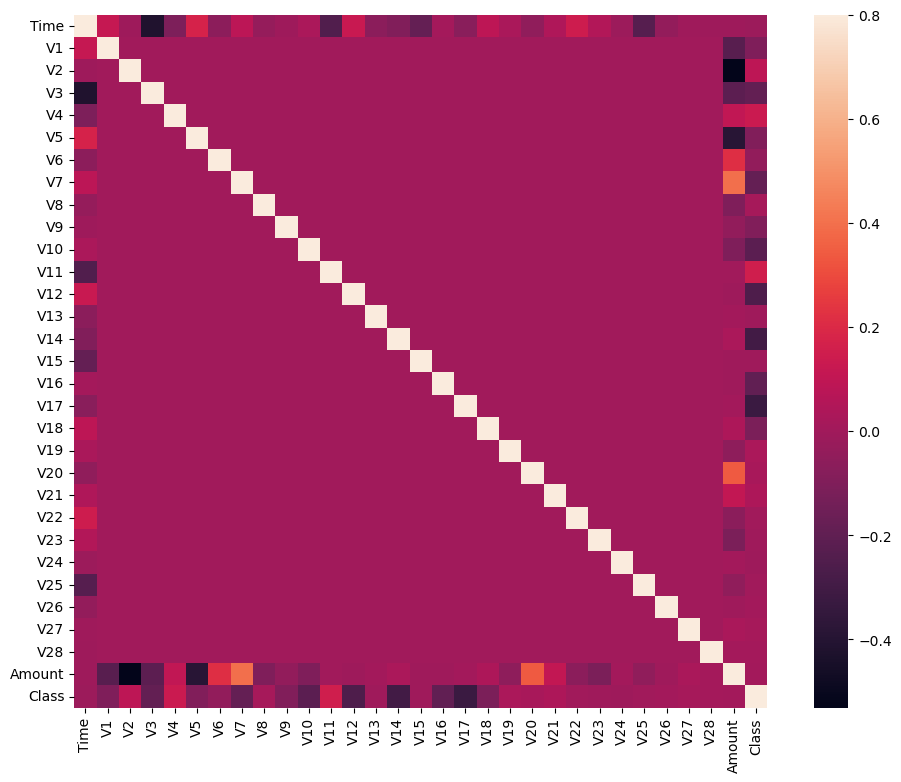

In [18]:
# Correlation matrix
corrmat = data.corr()
fig = plt.figure(figsize = (12, 9))
sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

In the HeatMap we can clearly see that most of the features do not correlate to other features but there are some features that either has a positive or a negative correlation with each other. For example, V2 and V5 are highly negatively correlated with the feature called Amount. We also see some correlation with V20 and Amount. This gives us a deeper understanding of the Data available to us.

### Code : Separating the X and the Y values
Dividing the data into inputs parameters and outputs value format

In [19]:
# dividing the X and the Y from the dataset
X = data.drop(['Class'], axis = 1)
Y = data["Class"]
print(X.shape)
print(Y.shape)
# getting just the values for the sake of processing 
# (its a numpy array with no columns)
xData = X.values
yData = Y.values

(284805, 30)
(284805,)


### Training and Testing Data Bifurcation
We will be dividing the dataset into two main groups. One for training the model and the other for Testing our trained model’s performance.

In [20]:
# Using Scikit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
xTrain, xTest, yTrain, yTest = train_test_split(
    xData, yData, test_size = 0.2, random_state = 42)

### Code : Building a Random Forest Model using scikit learn

In [23]:
# Building the Random Forest Classifier (RANDOM FOREST)
from sklearn.ensemble import RandomForestClassifier
# random forest model creation
rfc = RandomForestClassifier()
rfc.fit(xTrain, yTrain)

RandomForestClassifier()

In [24]:
# predictions
yPred = rfc.predict(xTest)

### Code : Building all kinds of evaluating parameters

In [25]:
# Evaluating the classifier
# printing every score of the classifier
# scoring in anything
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, matthews_corrcoef
from sklearn.metrics import confusion_matrix

n_outliers = len(fraud)
n_errors = (yPred != yTest).sum()
print("The model used is Random Forest classifier")

acc = accuracy_score(yTest, yPred)
print("The accuracy is {}".format(acc))

prec = precision_score(yTest, yPred)
print("The precision is {}".format(prec))

rec = recall_score(yTest, yPred)
print("The recall is {}".format(rec))

f1 = f1_score(yTest, yPred)
print("The F1-Score is {}".format(f1))

MCC = matthews_corrcoef(yTest, yPred)
print("The Matthews correlation coefficient is{}".format(MCC))

The model used is Random Forest classifier
The accuracy is 0.9995786590825302
The precision is 0.9166666666666666
The recall is 0.8191489361702128
The F1-Score is 0.8651685393258427
The Matthews correlation coefficient is0.8663307043632481


### Code : Visualizing the Confusion Matrix

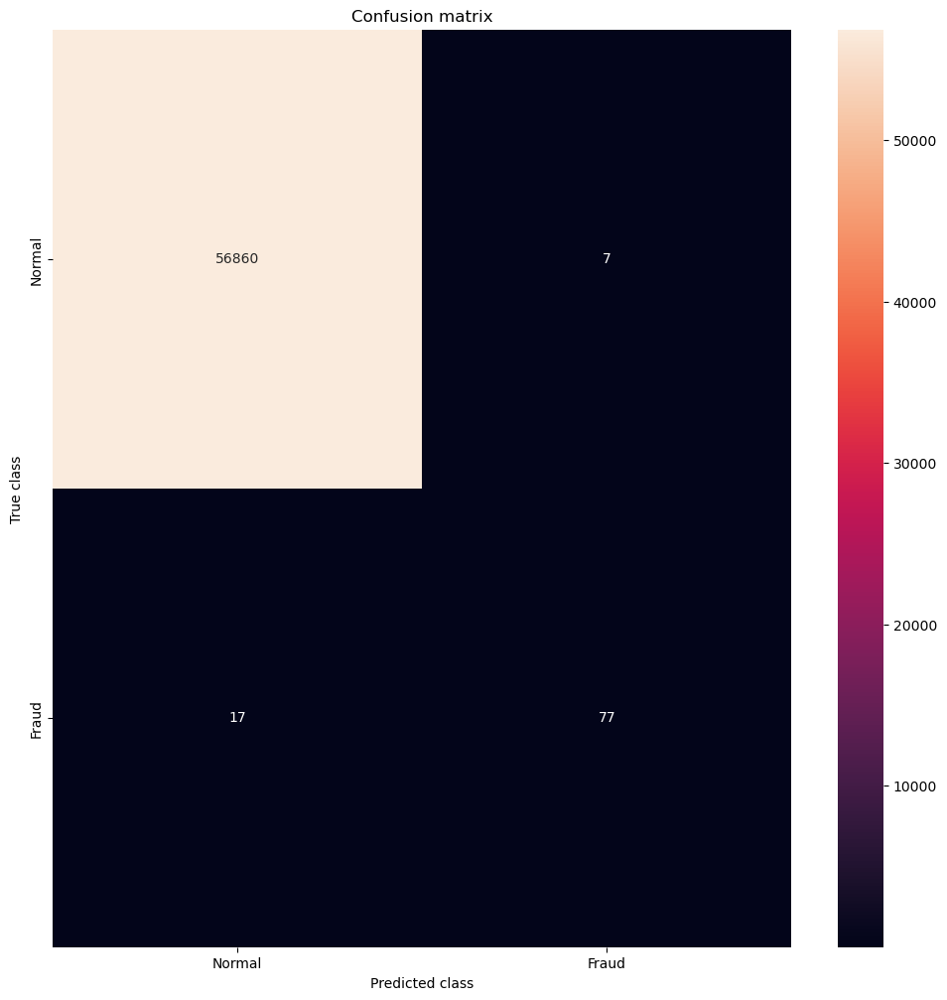

In [27]:
# printing the confusion matrix
LABELS = ['Normal', 'Fraud']
conf_matrix = confusion_matrix(yTest, yPred)
plt.figure(figsize =(12, 12))
sns.heatmap(conf_matrix, xticklabels = LABELS,
                yticklabels = LABELS, annot = True, fmt ="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()